In [9]:
import warnings
import itertools
import numpy as np
import verde as vd
import pandas as pd
import xarray as xr
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
import eqs_magnetics as eqs

In [10]:
# Suppress some scikit-learn warning that isn't valid
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

Set the data coordinates and field direction.

N data: 92046


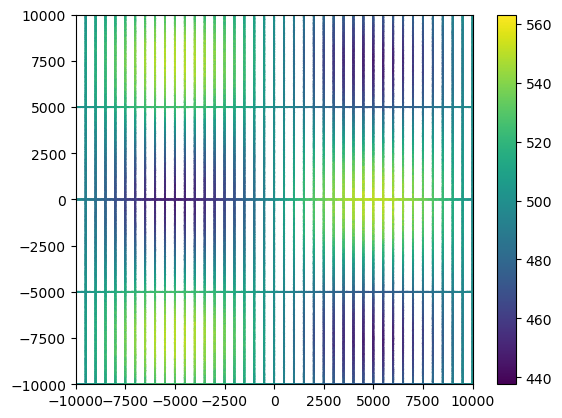

In [11]:
region = [-10e3, 10e3, -10e3, 10e3]
# Inc and dec from the IGRF around Antarctica
field_direction = eqs.angles_to_vector(inclination=-45, declination=-70, amplitude=1)
#field_direction = eqs.angles_to_vector(inclination=84, declination=120, amplitude=1)

# Generate fake flight lines
easting, northing = [c.ravel() for c in vd.grid_coordinates(region, spacing=(10, 500))]
easting_tie, northing_tie = [c.ravel() for c in vd.grid_coordinates(region, spacing=(5000, 10))]
easting = np.concatenate([easting, easting_tie])
northing = np.concatenate([northing, northing_tie])
upward = vd.synthetic.CheckerBoard(region=region, amplitude=50, w_east=20000, w_north=15000).predict((easting, northing)) + 500
coordinates = (easting, northing, upward)
for i, c in enumerate(coordinates):
    eqs.contaminate(c, standard_deviation=4, random_state=i)

print("N data:", coordinates[0].size)

plt.scatter(*coordinates[:2], c=coordinates[2], s=0.1)
plt.xlim(*region[:2])
plt.ylim(*region[2:])
plt.colorbar()
plt.show()

In [12]:
dipole_moments = []
source_coordinates = []
# Regional
source_coordinates.append([[-1500], [-2000], [-5e3]])
dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))

source_coordinates.append([[0], [0], [-5e3]])
dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))

source_coordinates.append([[1500], [2000], [-5e3]])
dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))


# Point source top left
source_coordinates.append([[-6000], [6000], [-90]])
dipole_moments.append(eqs.angles_to_vector(-50, 40, 15e8))

# Point source middle
source_coordinates.append([[500], [1000], [-300]])
dipole_moments.append(eqs.angles_to_vector(60, 65, 50e8))

# point source bottom right
source_coordinates.append([[7000], [-5000], [-150]])
dipole_moments.append(eqs.angles_to_vector(40, 55, 15e8))

source_coordinates = np.concatenate(source_coordinates, axis=1)
dipole_moments = np.concatenate(dipole_moments, axis=1)

In [13]:
b_field = eqs.dipole_magnetic(coordinates, source_coordinates, dipole_moments)
tfa = eqs.contaminate(
    eqs.total_field_anomaly(b_field, field_direction), standard_deviation=50, random_state=42,
)
bnorm = eqs.magnetic_field_norm(b_field)

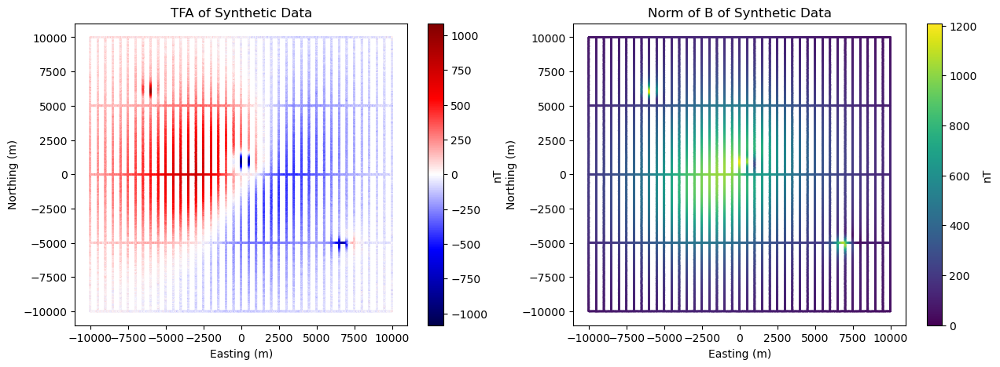

In [14]:
plt.figure(figsize=(15,5))
scale = vd.maxabs(tfa)
#scale = 1000
plt.subplot(1,2,1)
plt.scatter(*coordinates[:2], c=tfa, cmap="seismic", s=0.5, vmin=-scale, vmax=scale)
plt.title("TFA of Synthetic Data")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

scale_bnorm = vd.maxabs(bnorm)
plt.subplot(1,2,2)
plt.scatter(*coordinates[:2], c=bnorm, cmap="viridis", s=0.5, vmin=0, vmax=scale_bnorm)
plt.title("Norm of B of Synthetic Data")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")
plt.show()

## Single layer

In [15]:
dampings = [1e-4, 1e-3, 1e-2, 1e-1]
depths = [1e3, 1.5e3, 2e3]
parameter_sets = [
    dict(damping=combo[0], depth=combo[1])
    for combo in itertools.product(dampings, depths)
]
print("Number of combinations:", len(parameter_sets))

Number of combinations: 12


In [16]:
%%time
kfold = vd.BlockKFold(
    spacing=3e3,
    shuffle=True,
    random_state=0,
    balance=True,
)
features = np.transpose(coordinates[:2])
scores = []
damping = []
source_depth = []
for parameters in parameter_sets:    
    print(parameters)
    eqs_shallow = eqs.EquivalentSourcesMagneticGB(random_state=0, block_size=100, **parameters)
    tmp = []
    for train, test in kfold.split(features):
        eqs_shallow.fit(
            [c[train] for c in coordinates], 
            tfa[train], 
            field_direction,
        )
        predicted = eqs.total_field_anomaly(
            eqs_shallow.predict([c[test] for c in coordinates]),
            field_direction,
        )
        tmp.append(np.linalg.norm(tfa[test] - predicted))
    scores.append(np.mean(tmp))
    damping.append(parameters['damping'])
    source_depth.append(parameters['depth'])

{'damping': 0.0001, 'depth': 1000.0}
{'damping': 0.0001, 'depth': 1500.0}
{'damping': 0.0001, 'depth': 2000.0}
{'damping': 0.001, 'depth': 1000.0}
{'damping': 0.001, 'depth': 1500.0}
{'damping': 0.001, 'depth': 2000.0}
{'damping': 0.01, 'depth': 1000.0}
{'damping': 0.01, 'depth': 1500.0}
{'damping': 0.01, 'depth': 2000.0}
{'damping': 0.1, 'depth': 1000.0}
{'damping': 0.1, 'depth': 1500.0}
{'damping': 0.1, 'depth': 2000.0}
CPU times: user 2h 50min 52s, sys: 1min 11s, total: 2h 52min 4s
Wall time: 29min 22s


{'damping': 0.1, 'depth': 2000.0}

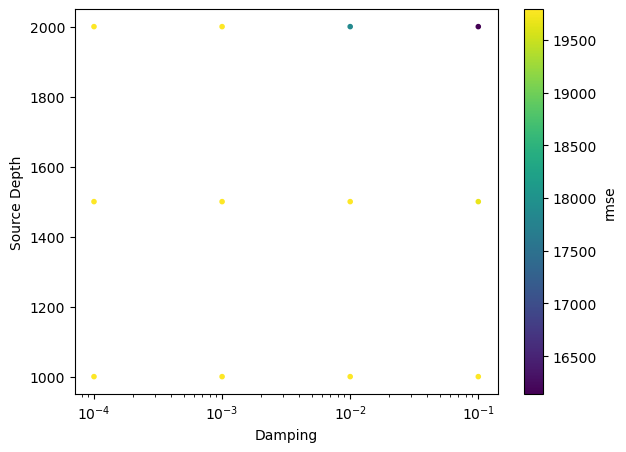

In [17]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.scatter(
    damping,
    source_depth,
    c=scores,
    cmap="viridis",
    marker='.',
    vmax= np.percentile(scores,20),
)
plt.xlabel('Damping')
plt.ylabel('Source Depth')
plt.xscale('log')
plt.colorbar(label='rmse')

best = np.argmin(scores)
parameter_sets[best]

In [18]:
eqs_single = eqs.EquivalentSourcesMagneticGB(random_state=0, block_size=100, **parameter_sets[best])
eqs_single.fit(coordinates, tfa, field_direction)
print("dipole height:", eqs_shallow.dipole_coordinates_[2][0])
print("window size:", eqs_shallow.window_size_)

dipole height: -1480.5524715436538
window size: 5244.374295746049


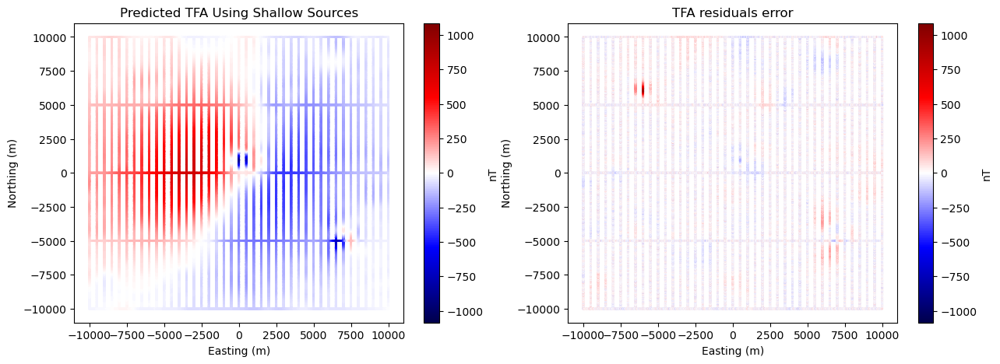

In [21]:
tfa_prediction = eqs.total_field_anomaly(eqs_shallow.predict(coordinates), field_direction)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.scatter(*coordinates[:2], c=tfa_prediction, cmap="seismic", s=1, vmin=-scale, vmax=scale)
plt.title("Predicted TFA Using Shallow Sources")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

plt.subplot(1,2,2)
plt.scatter(*coordinates[:2], c=tfa - tfa_prediction, cmap="seismic", s=1, vmin=-scale, vmax=scale)
plt.title("TFA residuals error")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")
plt.show()

## Fit deep sources¶

In [84]:
spacing = 2e3
reducer = vd.BlockReduce(reduction=np.median, spacing=spacing, region=(vd.pad_region(vd.get_region(coordinates), pad=spacing*0.8)), drop_coords=False)#, center_coordinates=True)
# Use the filter method to apply the reduction:
coords_blocked, tfa_blocked = reducer.filter(coordinates, data=tfa)

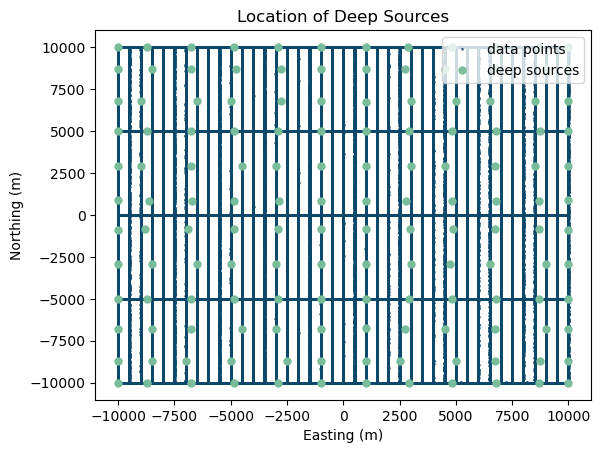

In [85]:
plt.figure()
plt.plot(*coordinates[:2], "v", color="#0B486B", markersize=1, label='data points')
plt.plot(*coords_blocked[:2], "o", color="#79BD9A", markersize=5, label='deep sources')
plt.title("Location of Deep Sources")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.legend()
plt.show()

In [9]:
# extra_coords1 = vd.grid_coordinates([-15e3, 15e3, -15e3, -10e3], spacing=2e3, extra_coords=500)
# extra_coords2 = vd.grid_coordinates([-15e3, 15e3, 10e3, 15e3], spacing=2e3, extra_coords=500)

# extra_coords_easting = np.append(extra_coords1[0], extra_coords2[0])
# extra_coords_northing = np.append(extra_coords1[1], extra_coords2[1])
# extra_coords_upwards = np.append(extra_coords1[2], extra_coords2[2])

# extra_coords3 = vd.grid_coordinates([-15e3, -10e3, -8e3, 8e3], spacing=2e3, extra_coords=500)
# extra_coords_easting = np.append(extra_coords_easting, extra_coords3[0])
# extra_coords_northing = np.append(extra_coords_northing, extra_coords3[1])
# extra_coords_upwards = np.append(extra_coords_upwards, extra_coords3[2])

# extra_coords4 = vd.grid_coordinates([10e3, 15e3, -8e3, 8e3], spacing=2e3, extra_coords=500)
# extra_coords_easting = np.append(extra_coords_easting, extra_coords4[0])
# extra_coords_northing = np.append(extra_coords_northing, extra_coords4[1])
# extra_coords_upwards = np.append(extra_coords_upwards, extra_coords4[2])

# extra_coords = [extra_coords_easting, extra_coords_northing, extra_coords_upwards]

# coords_blocked_extra = [
#     np.append(coords_blocked[0],extra_coords[0]),
#     np.append(coords_blocked[1],extra_coords[1]), 
#     np.append(coords_blocked[2],extra_coords[2])
# ]

# extra_tfa = np.zeros(shape=np.shape(extra_coords[0]))
# tfa_blocked_extra = np.append(tfa_blocked, extra_tfa)

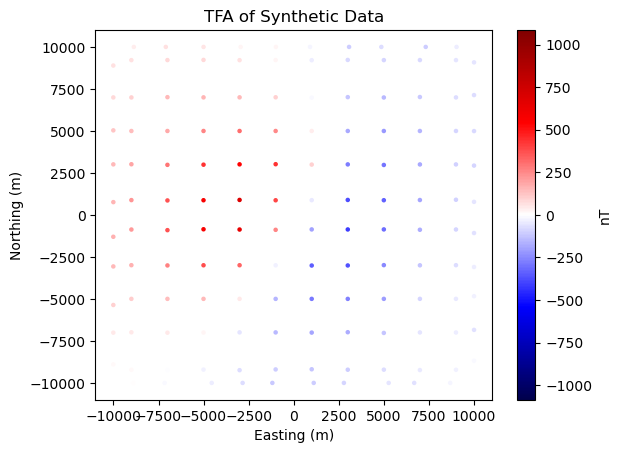

In [10]:
plt.figure()
plt.scatter(*coords_blocked[:2], c=tfa_blocked, cmap="seismic", s=5, vmin=-scale, vmax=scale)
plt.title("TFA of Synthetic Data")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")
plt.show()

In [11]:
# dampings = [1e-4, 1e-3, 1e-2]
spacing = np.mean(vd.median_distance(coords_blocked))
# depths = [spacing*2.5, spacing*4.25, spacing*6]
dampings = [1e-3]
depths = [spacing*4.25]

In [12]:
parameter_sets = [
    dict(damping=combo[0], depth=combo[1])
    for combo in itertools.product(dampings, depths)
]
print("Number of combinations:", len(parameter_sets))
# print("Combinations:", parameter_sets)

Number of combinations: 1


In [13]:
%%time
kfold = vd.BlockKFold(
    spacing=2500,
    shuffle=True,
    random_state=0,
    balance=True,
)
features = np.transpose(coords_blocked[:2])
scores = []
for parameters in parameter_sets:    
    print(parameters)
    eqs_deep = eqs.EquivalentSourcesMagnetic(block_size=100, **parameters)
    tmp = []
    for train, test in kfold.split(features):
        eqs_deep.fit(
            [c[train] for c in coords_blocked], 
            tfa_blocked[train], 
            field_direction,
        )
        predicted = eqs.total_field_anomaly(
            eqs_deep.predict([c[test] for c in coords_blocked]),
            field_direction,
        )
        tmp.append(np.linalg.norm(tfa_blocked[test] - predicted))
    scores.append(np.mean(tmp))
    print(np.mean(tmp))

{'damping': 0.001, 'depth': 5857.924660561465}
123.83681736293838
CPU times: user 12.1 s, sys: 4.5 s, total: 16.6 s
Wall time: 836 ms


In [14]:
best = np.argmin(scores)
parameter_sets[best]

{'damping': 0.001, 'depth': 5857.924660561465}

In [15]:
%%time
eqs_deep = eqs.EquivalentSourcesMagnetic(**parameter_sets[best])
eqs_deep.fit(coords_blocked, tfa_blocked, field_direction)
print("source height:", eqs_deep.dipole_coordinates_[2][0])

source height: -5349.890193933629
CPU times: user 1.64 s, sys: 842 ms, total: 2.48 s
Wall time: 282 ms


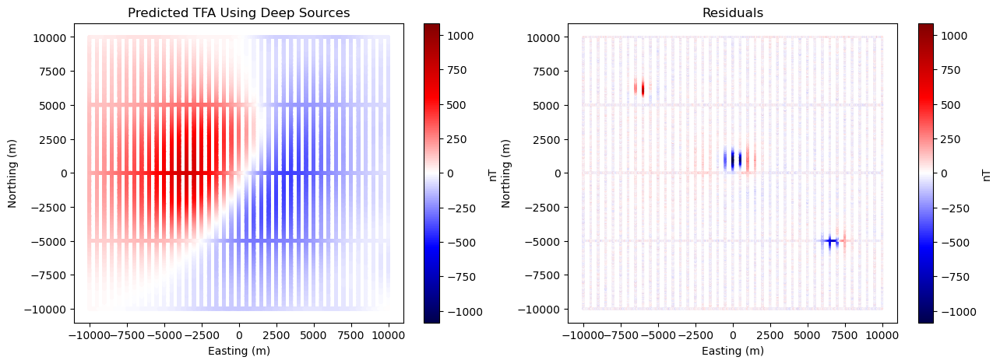

In [16]:
tfa_deep_blocked = eqs.total_field_anomaly(eqs_deep.predict(coords_blocked), field_direction)
tfa_deep = eqs.total_field_anomaly(eqs_deep.predict(coordinates), field_direction)
tfa_residuals = tfa - tfa_deep

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.scatter(*coordinates[:2], c=tfa_deep, cmap="seismic", s=5, vmin=-scale, vmax=scale)
plt.title("Predicted TFA Using Deep Sources")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

plt.subplot(1,2,2)
plt.scatter(*coordinates[:2], c=tfa_residuals, cmap="seismic", s=1, vmin=-scale, vmax=scale)
plt.title("Residuals")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")
plt.show()

## Fit the deep residuals with gradient-boosted sources

In [17]:
# spacing = np.mean(vd.median_distance(coordinates))
# depths = [spacing*2.5, spacing*4.25, spacing*6]
# dampings = [1e1, 1e2, 1e3]
# depths = [500, 1e3, 1.5e3]
dampings = [1e2]
depths = [1e3]

In [18]:
parameter_sets = [
    dict(damping=combo[0], depth=combo[1])
    for combo in itertools.product(dampings, depths)
]
print("Number of combinations:", len(parameter_sets))
# print("Combinations:", parameter_sets)

Number of combinations: 1


In [19]:
%%time
kfold = vd.BlockKFold(
    spacing=500,
    shuffle=True,
    random_state=0,
    balance=True,
)
features = np.transpose(coordinates[:2])
scores = []
for parameters in parameter_sets:    
    print(parameters)
    eqs_shallow = eqs.EquivalentSourcesMagneticGB(random_state=0, block_size=100, **parameters)
    tmp = []
    for train, test in kfold.split(features):
        eqs_shallow.fit(
            [c[train] for c in coordinates], 
            tfa_residuals[train], 
            field_direction,
        )
        predicted = eqs.total_field_anomaly(
            eqs_shallow.predict([c[test] for c in coordinates]),
            field_direction,
        )
        tmp.append(np.linalg.norm(tfa_residuals[test] - predicted))
    scores.append(np.mean(tmp))
    print(np.mean(tmp))

{'damping': 100.0, 'depth': 1000.0}
7039.701374762875
CPU times: user 14min 40s, sys: 4min 1s, total: 18min 41s
Wall time: 48.6 s


In [20]:
best = np.argmin(scores)
parameter_sets[best]

{'damping': 100.0, 'depth': 1000.0}

In [97]:
%%time
eqs_shallow = eqs.EquivalentSourcesMagneticGB(random_state=0, block_size=100, **parameter_sets[best], repeat=2)
eqs_shallow.fit(coordinates, tfa_residuals, field_direction)
print("dipole height:", eqs_shallow.dipole_coordinates_[2][0])
print("window size:", eqs_shallow.window_size_)

dipole height: -501.0235550450832
window size: 4667.985732163489
CPU times: user 11min 31s, sys: 3min 4s, total: 14min 35s
Wall time: 34.1 s


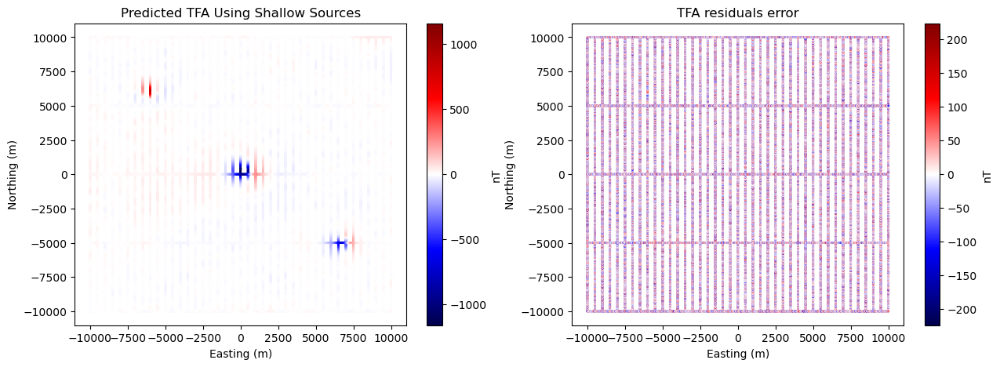

In [98]:
tfa_residuals_prediction = eqs.total_field_anomaly(eqs_shallow.predict(coordinates), field_direction)

plt.figure(figsize=(15,5))
scale = vd.maxabs(tfa_residuals_prediction)
plt.subplot(1,2,1)
plt.scatter(*coordinates[:2], c=tfa_residuals_prediction, cmap="seismic", s=1, vmin=-scale, vmax=scale)
plt.title("Predicted TFA Using Shallow Sources")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

plt.subplot(1,2,2)
scale = vd.maxabs(tfa_residuals - tfa_residuals_prediction)
plt.scatter(*coordinates[:2], c=tfa_residuals - tfa_residuals_prediction, cmap="seismic", s=1, vmin=-scale, vmax=scale)
plt.title("TFA residuals error")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")
plt.show()

## Predict the norm of B

In [99]:
grid_coordinates = vd.grid_coordinates(region, spacing=100, extra_coords=500)
true_b = eqs.dipole_magnetic(grid_coordinates, source_coordinates, dipole_moments)
predicted_b = eqs_deep.predict(grid_coordinates) + eqs_shallow.predict(grid_coordinates)

true_tfa = eqs.total_field_anomaly(true_b, field_direction)
predicted_tfa = eqs.total_field_anomaly(predicted_b, field_direction)
error_tfa = true_tfa - predicted_tfa

In [100]:
true_norm_of_b = np.sqrt(sum(c**2 for c in true_b))
predicted_norm_of_b = np.sqrt(sum(c**2 for c in predicted_b))
error_norm_of_b = true_norm_of_b - predicted_norm_of_b

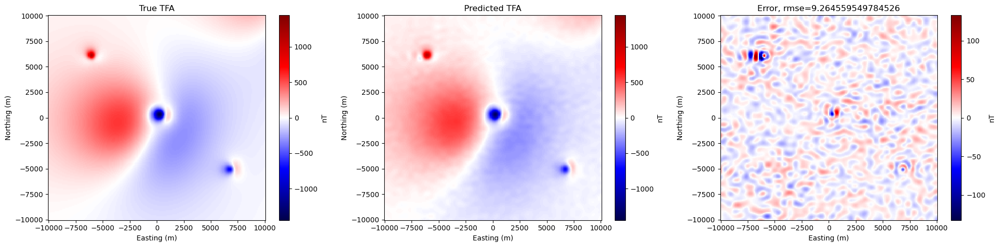

In [101]:
scale_tfa = vd.maxabs(true_tfa)
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.pcolormesh(*grid_coordinates[:2], true_tfa, cmap="seismic", vmin=-scale_tfa, vmax=scale_tfa)
plt.title("True TFA")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

plt.subplot(1,3,2)
plt.pcolormesh(*grid_coordinates[:2], predicted_tfa, cmap="seismic", vmin=-scale_tfa, vmax=scale_tfa)
plt.title("Predicted TFA")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

plt.subplot(1,3,3)
diff_scale = vd.maxabs(error_tfa)
rmse_tfa = np.sqrt(np.square(error_tfa).mean())
plt.pcolormesh(*grid_coordinates[:2], error_tfa, cmap="seismic", vmin=-diff_scale, vmax=diff_scale)
plt.title('Error, rmse={}'.format(rmse_tfa))
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")
plt.tight_layout()
plt.show()

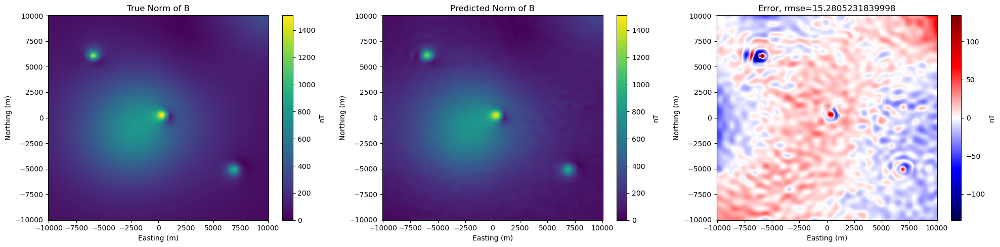

In [91]:
scale_b = vd.maxabs(true_norm_of_b)
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.pcolormesh(*grid_coordinates[:2], true_norm_of_b, cmap="viridis", vmin=0, vmax=scale_b)
plt.title("True Norm of B")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

plt.subplot(1,3,2)
plt.pcolormesh(*grid_coordinates[:2], predicted_norm_of_b, cmap="viridis", vmin=0, vmax=scale_b)
plt.title("Predicted Norm of B")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")

plt.subplot(1,3,3)
diff_scale = vd.maxabs(error_norm_of_b)
rmse_bnorm = np.sqrt(np.square(error_norm_of_b).mean())
plt.pcolormesh(*grid_coordinates[:2], error_norm_of_b, cmap="seismic", vmin=-diff_scale, vmax=diff_scale)
plt.title('Error, rmse={}'.format(rmse_bnorm))
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")
plt.colorbar(label="nT")
plt.tight_layout()
plt.show()

## Moving the whole regional

regional source eastings: -1500


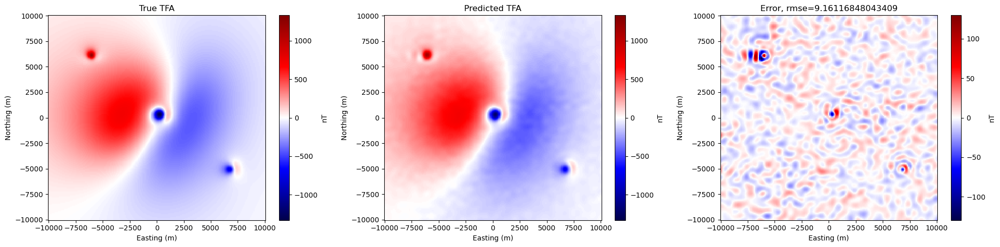

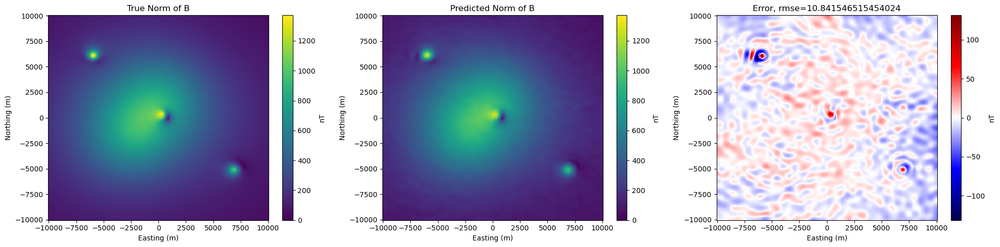

regional source eastings: 500


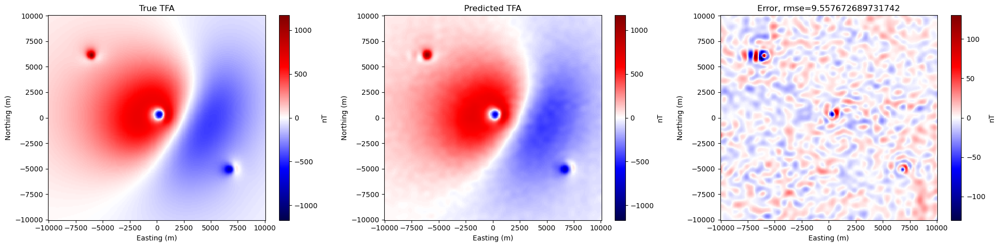

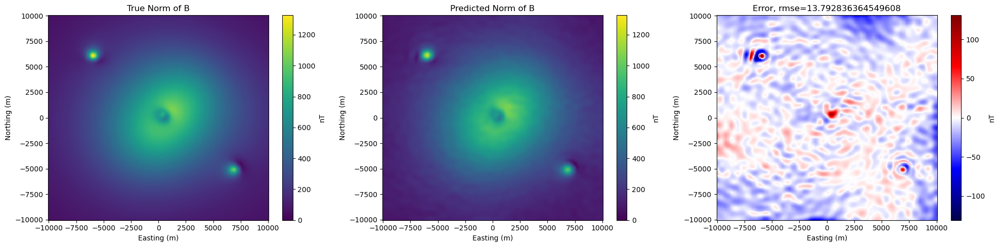

regional source eastings: 1500


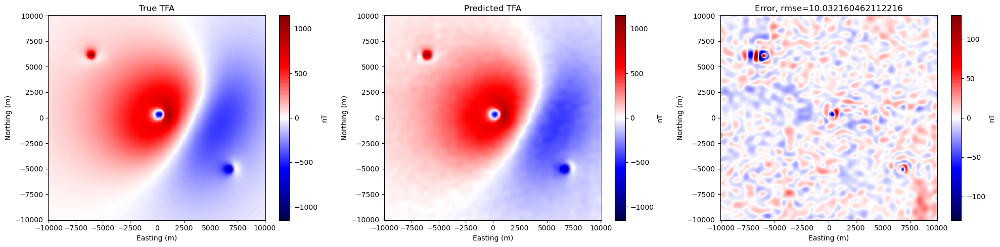

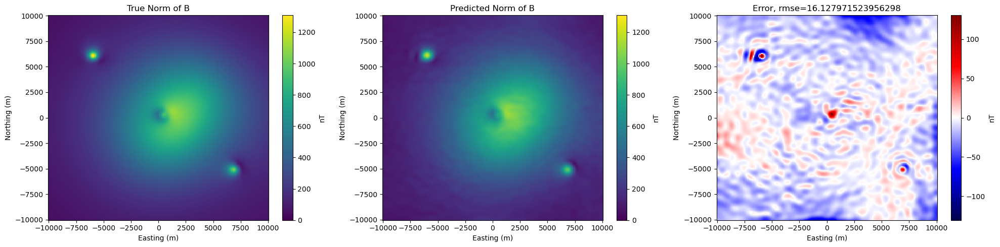

regional source eastings: 2500


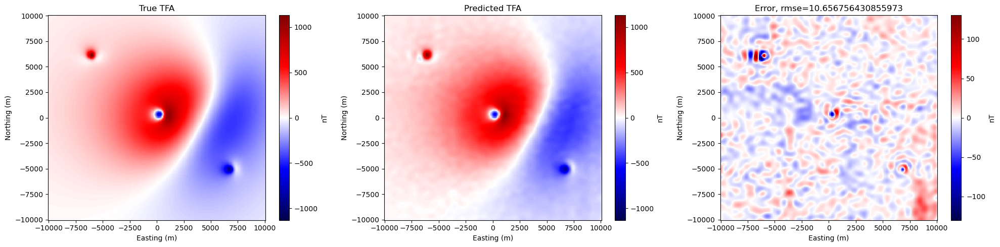

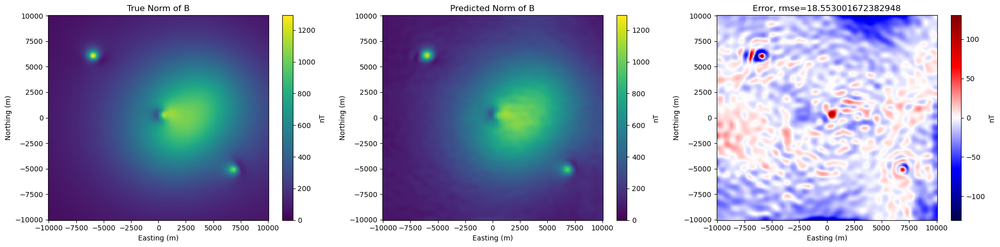

regional source eastings: 3500


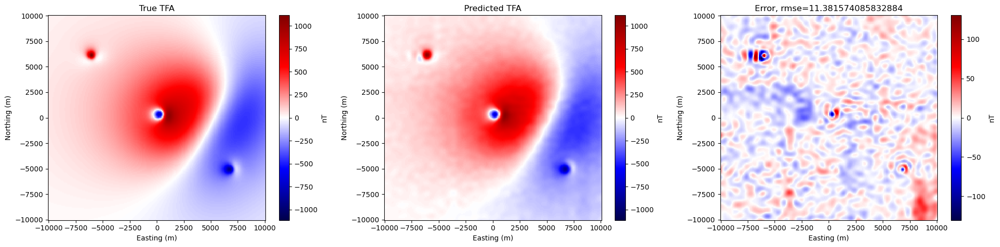

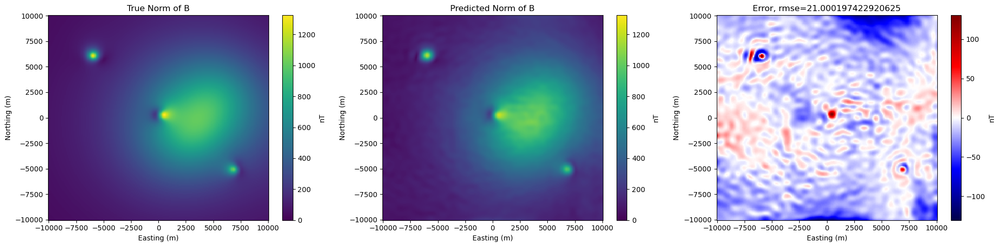

regional source eastings: 4500


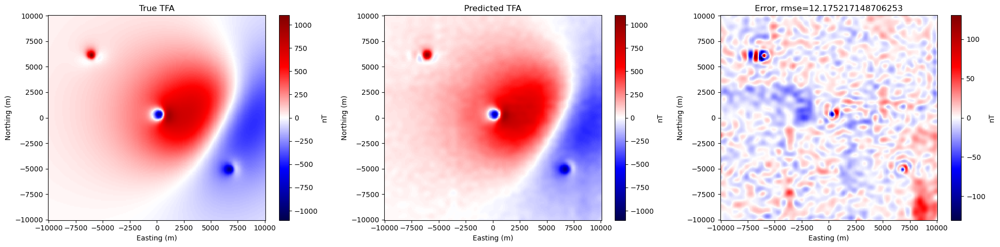

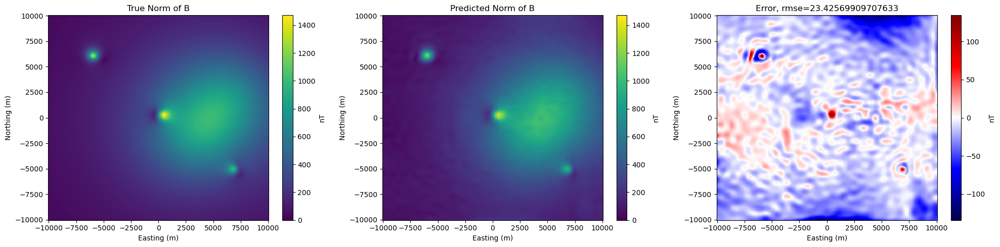

regional source eastings: 5500


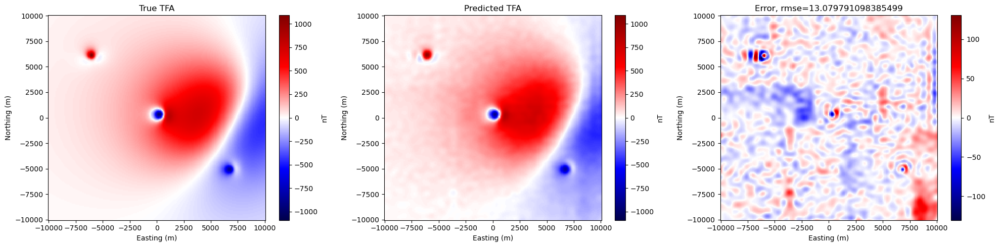

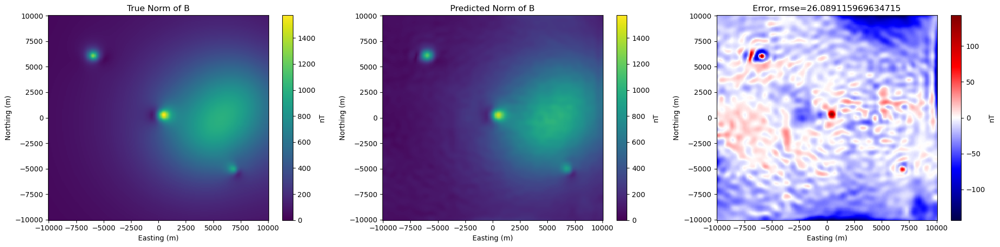

regional source eastings: 6500


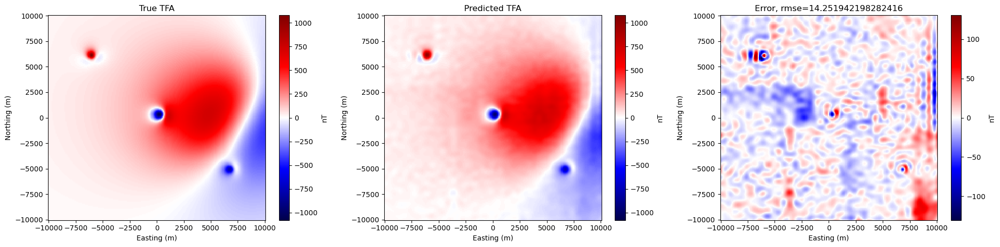

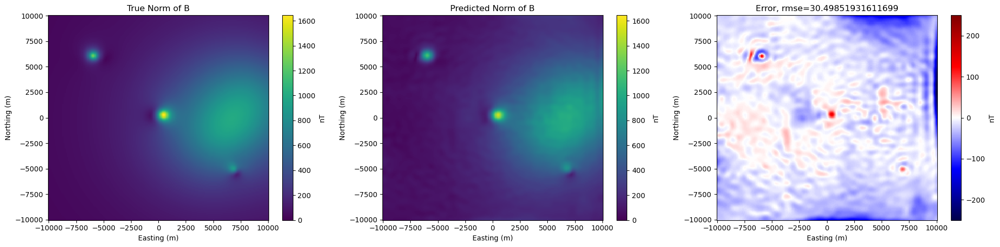

regional source eastings: 7500


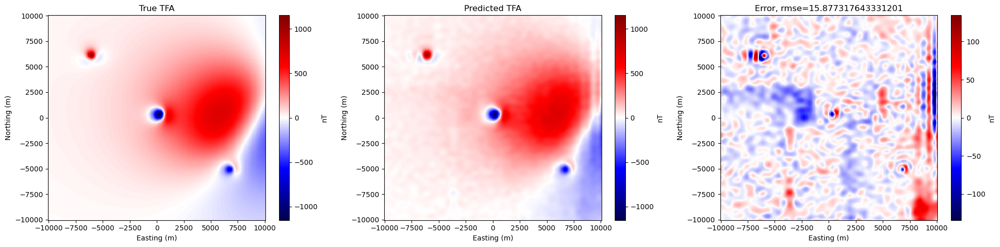

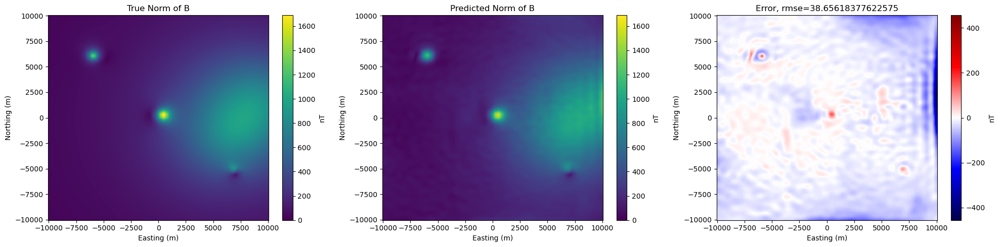

regional source eastings: 8500


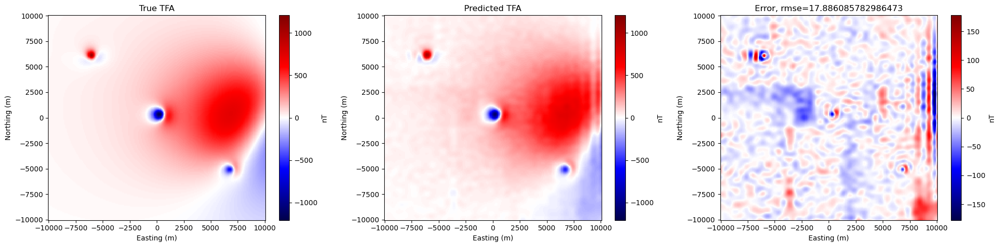

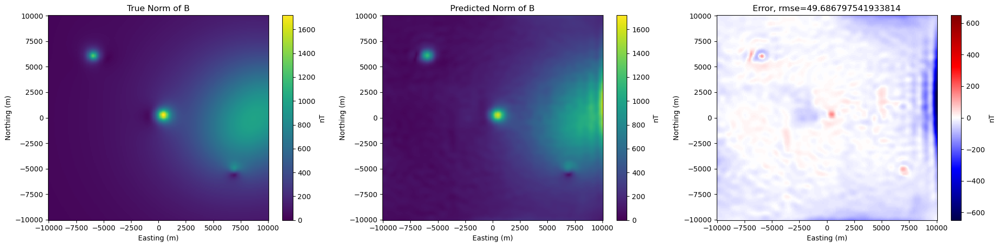

regional source eastings: 9500


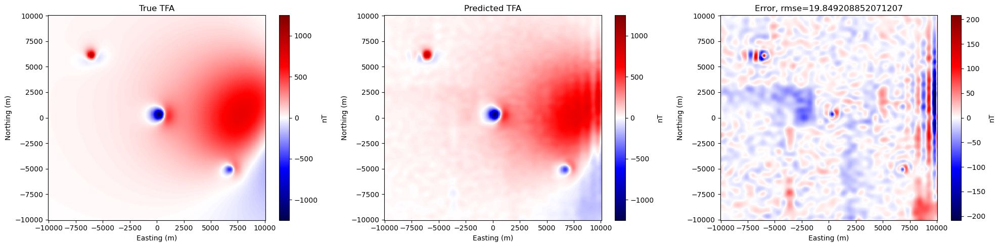

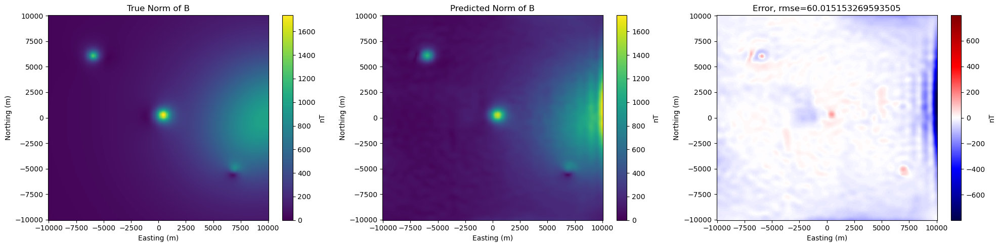

regional source eastings: 10500


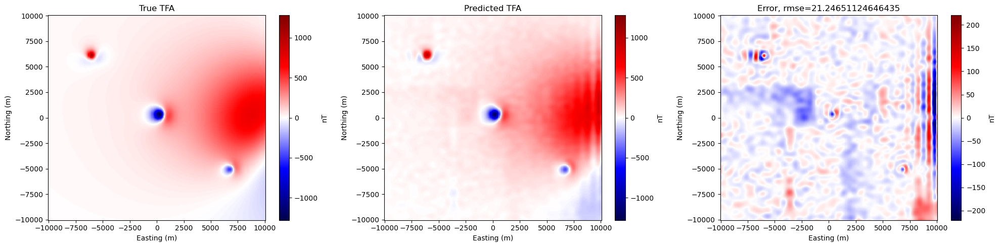

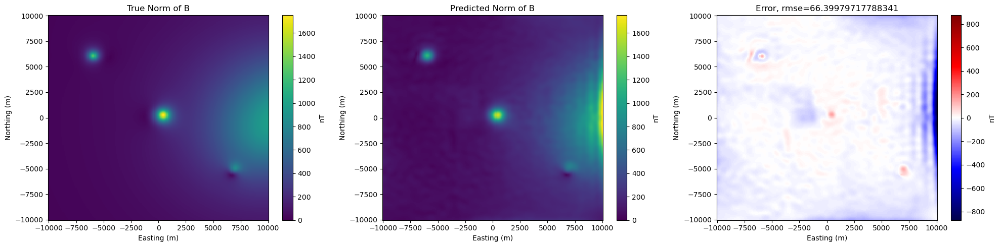

regional source eastings: 11500


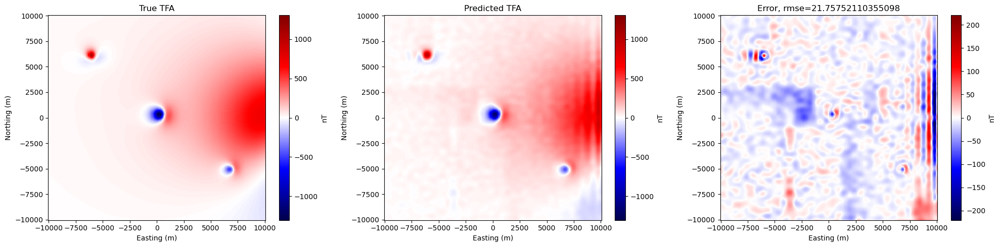

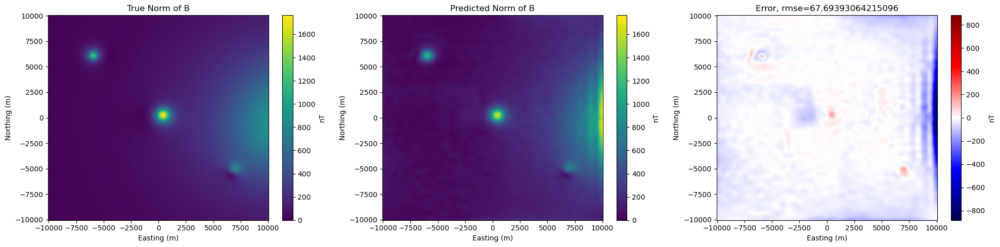

regional source eastings: 12500


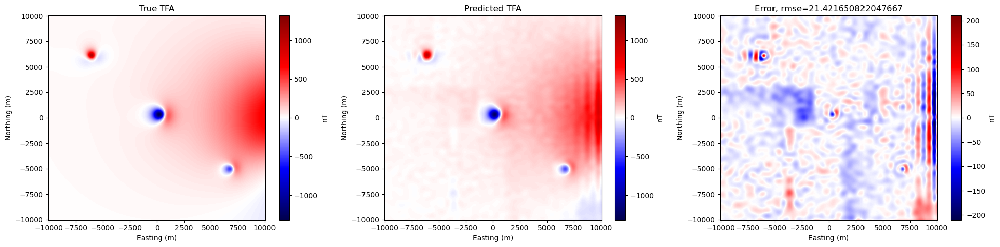

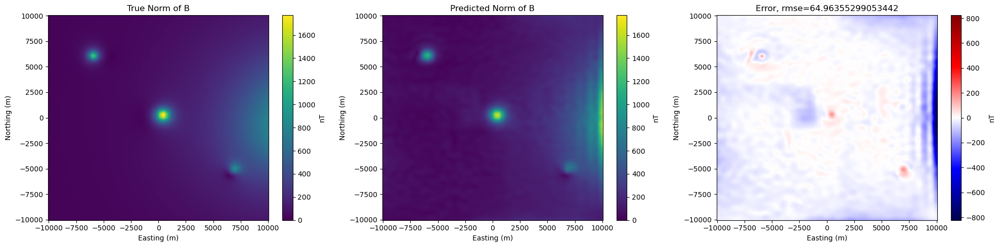

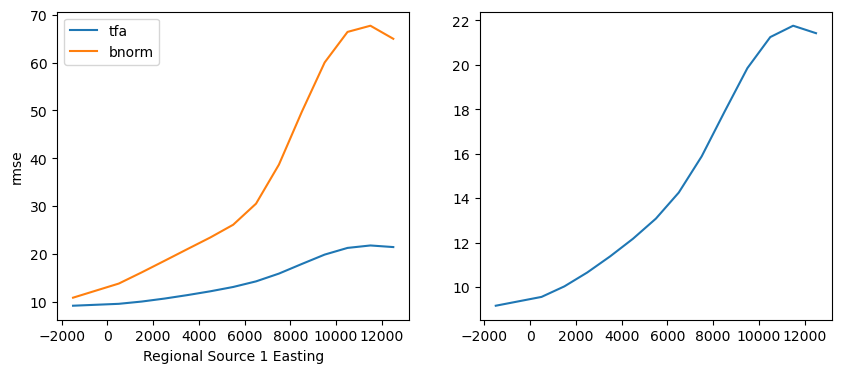

In [27]:
region = [-10e3, 10e3, -10e3, 10e3]
# Inc and dec from the IGRF around Antarctica
field_direction = eqs.angles_to_vector(inclination=-45, declination=-70, amplitude=1)
#field_direction = eqs.angles_to_vector(inclination=84, declination=120, amplitude=1)

# Generate fake flight lines
easting, northing = [c.ravel() for c in vd.grid_coordinates(region, spacing=(10, 500))]
easting_tie, northing_tie = [c.ravel() for c in vd.grid_coordinates(region, spacing=(5000, 10))]
easting = np.concatenate([easting, easting_tie])
northing = np.concatenate([northing, northing_tie])
upward = vd.synthetic.CheckerBoard(region=region, amplitude=50, w_east=20000, w_north=15000).predict((easting, northing)) + 500
coordinates = (easting, northing, upward)
for i, c in enumerate(coordinates):
    eqs.contaminate(c, standard_deviation=4, random_state=i)


regional_eastings = [-1500, 500, 1500, 2500, 3500, 4500, 5500, 6500, 7500, 8500, 9500, 10500, 11500, 12500]

rmses1_tfa = []
rmses1_bnorm = []

for i in regional_eastings:
    dipole_moments = []
    source_coordinates = []
    # Regional
    source_coordinates.append([[i], [-2000], [-5e3]])
    dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))
    source_coordinates.append([[(i+1500)], [0], [-5e3]])
    dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))
        # regional 3
    source_coordinates.append([[(i+3000)], [2000], [-5e3]])
    dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))
    # Point source top left
    source_coordinates.append([[-6000], [6000], [-90]])
    dipole_moments.append(eqs.angles_to_vector(-50, 40, 15e8))
    # Point source middle
    source_coordinates.append([[500], [300], [-300]])
    dipole_moments.append(eqs.angles_to_vector(60, 65, 50e8))
    # point source bottom right
    source_coordinates.append([[7000], [-5000], [-150]])
    dipole_moments.append(eqs.angles_to_vector(40, 55, 15e8))
    source_coordinates = np.concatenate(source_coordinates, axis=1)
    dipole_moments = np.concatenate(dipole_moments, axis=1)
    
    # SYNTHETIC
    b_field = eqs.dipole_magnetic(coordinates, source_coordinates, dipole_moments)
    tfa = eqs.contaminate(
        eqs.total_field_anomaly(b_field, field_direction), standard_deviation=50, random_state=42,
    )
    bnorm = eqs.magnetic_field_norm(b_field)
    
    ## DEEP EQS
    spacing = np.mean(vd.median_distance(coords_blocked))
    eqs_deep = eqs.EquivalentSourcesMagnetic(damping=1e-3, depth=(spacing*4.25))
    eqs_deep.fit(coords_blocked, tfa_blocked, field_direction)
    tfa_deep_blocked = eqs.total_field_anomaly(eqs_deep.predict(coords_blocked), field_direction)
    tfa_deep = eqs.total_field_anomaly(eqs_deep.predict(coordinates), field_direction)
    tfa_residuals = tfa - tfa_deep
    
    ## SHALLOW EQS
    eqs_shallow = eqs.EquivalentSourcesMagneticGB(random_state=0, block_size=100, damping=1e2, depth=1e3)
    eqs_shallow.fit(coordinates, tfa_residuals, field_direction)
    tfa_residuals_prediction = eqs.total_field_anomaly(eqs_shallow.predict(coordinates), field_direction)
    
    ## REGULAR GRID PREDICTION
    grid_coordinates = vd.grid_coordinates(region, spacing=100, extra_coords=500)
    true_b = eqs.dipole_magnetic(grid_coordinates, source_coordinates, dipole_moments)
    predicted_b = eqs_deep.predict(grid_coordinates) + eqs_shallow.predict(grid_coordinates)

    true_tfa = eqs.total_field_anomaly(true_b, field_direction)
    predicted_tfa = eqs.total_field_anomaly(predicted_b, field_direction)
    error_tfa = true_tfa - predicted_tfa
    
    true_norm_of_b = np.sqrt(sum(c**2 for c in true_b))
    predicted_norm_of_b = np.sqrt(sum(c**2 for c in predicted_b))
    error_norm_of_b = true_norm_of_b - predicted_norm_of_b
    
    print("regional source eastings:", i)
    
    scale_tfa = vd.maxabs(true_tfa)
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    plt.pcolormesh(*grid_coordinates[:2], true_tfa, cmap="seismic", vmin=-scale_tfa, vmax=scale_tfa)
    plt.title("True TFA")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,2)
    plt.pcolormesh(*grid_coordinates[:2], predicted_tfa, cmap="seismic", vmin=-scale_tfa, vmax=scale_tfa)
    plt.title("Predicted TFA")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,3)
    diff_scale = vd.maxabs(error_tfa)
    rmse_tfa = np.sqrt(np.square(error_tfa).mean())
    plt.pcolormesh(*grid_coordinates[:2], error_tfa, cmap="seismic", vmin=-diff_scale, vmax=diff_scale)
    plt.title('Error, rmse={}'.format(rmse_tfa))
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.tight_layout()
    plt.show()
    
    scale_b = vd.maxabs(true_norm_of_b)
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    plt.pcolormesh(*grid_coordinates[:2], true_norm_of_b, cmap="viridis", vmin=0, vmax=scale_b)
    plt.title("True Norm of B")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,2)
    plt.pcolormesh(*grid_coordinates[:2], predicted_norm_of_b, cmap="viridis", vmin=0, vmax=scale_b)
    plt.title("Predicted Norm of B")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,3)
    diff_scale = vd.maxabs(error_norm_of_b)
    rmse_bnorm = np.sqrt(np.square(error_norm_of_b).mean())
    plt.pcolormesh(*grid_coordinates[:2], error_norm_of_b, cmap="seismic", vmin=-diff_scale, vmax=diff_scale)
    plt.title('Error, rmse={}'.format(rmse_bnorm))
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.tight_layout()
    plt.show()
    
    rmses1_tfa.append(rmse_tfa)
    rmses1_bnorm.append(rmse_bnorm)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(regional_eastings, rmses1_tfa, label='tfa')
plt.plot(regional_eastings, rmses1_bnorm, label='bnorm')
plt.xlabel('Regional Source 1 Easting')
plt.ylabel('rmse')
plt.legend()
plt.subplot(1,2,2)
plt.plot(regional_eastings, rmses1_tfa, label='tfa')
plt.show()

## Moving 1 regional anomaly

regional source easting: 1500


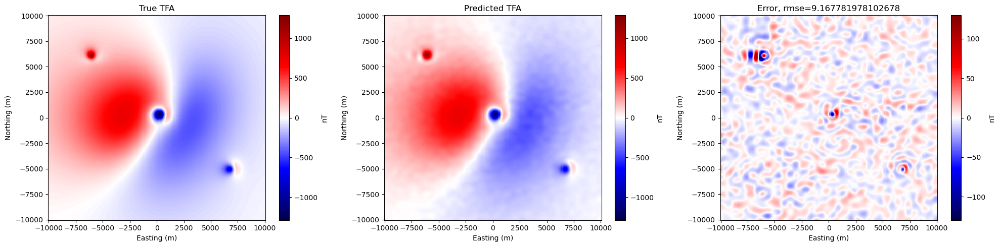

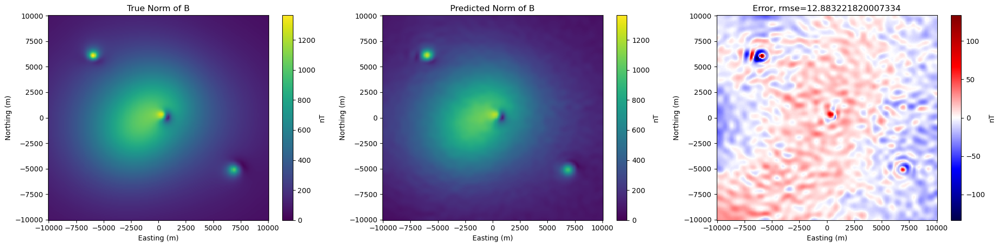

regional source easting: 2500


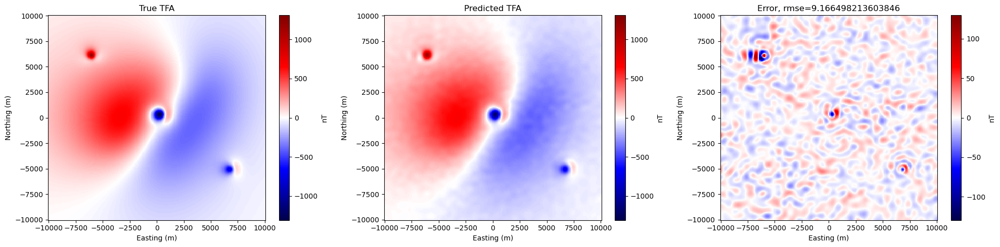

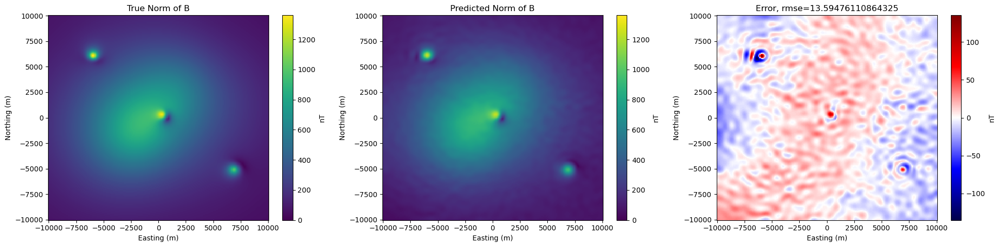

regional source easting: 3500


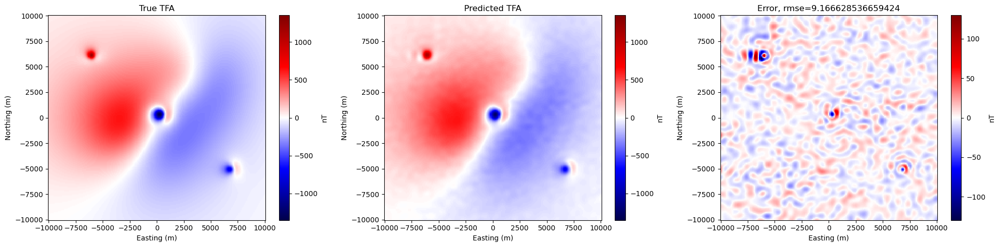

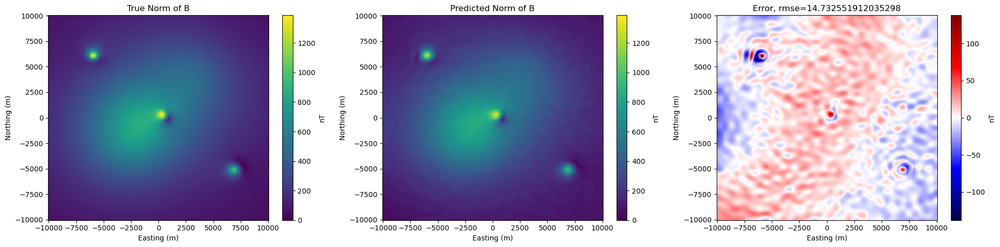

regional source easting: 4500


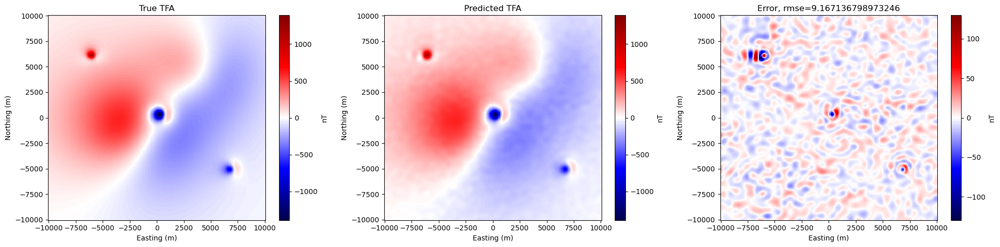

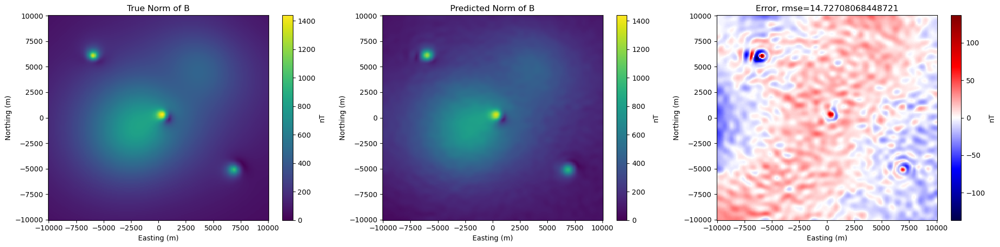

regional source easting: 5500


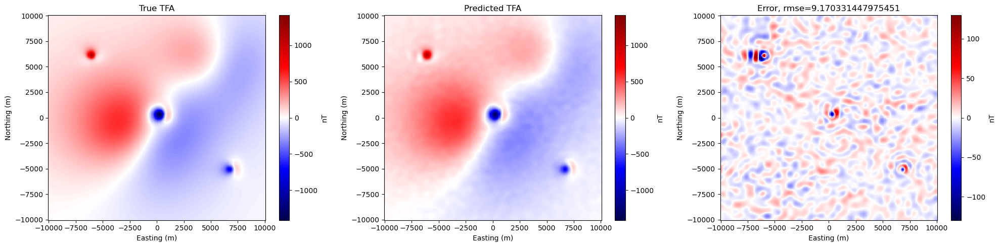

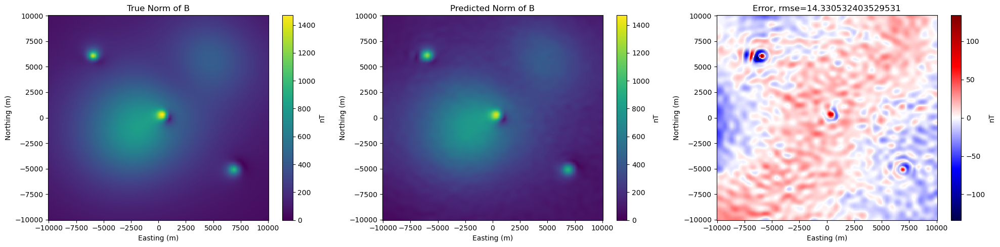

regional source easting: 6500


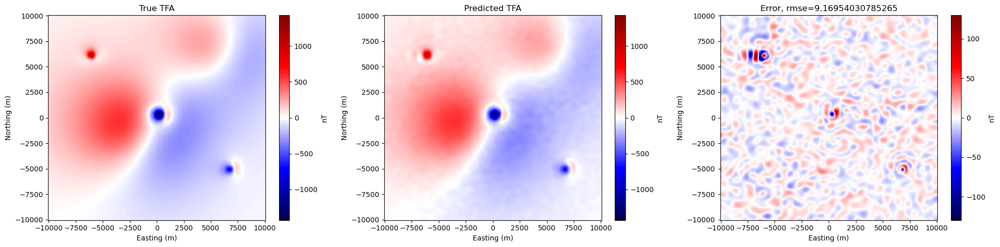

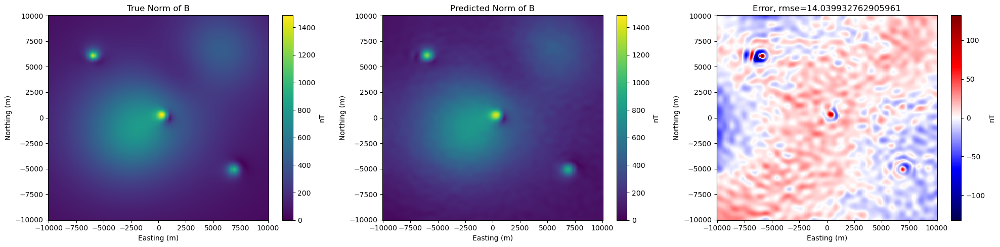

regional source easting: 7500


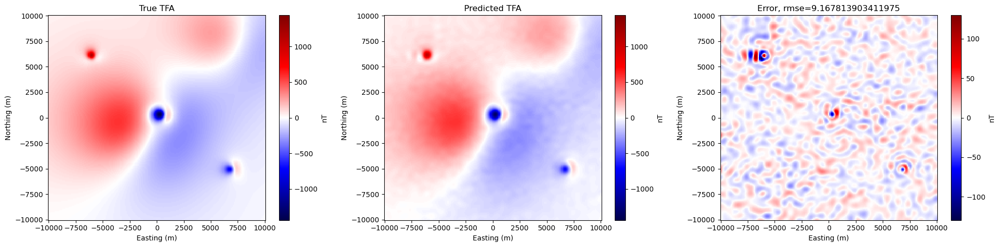

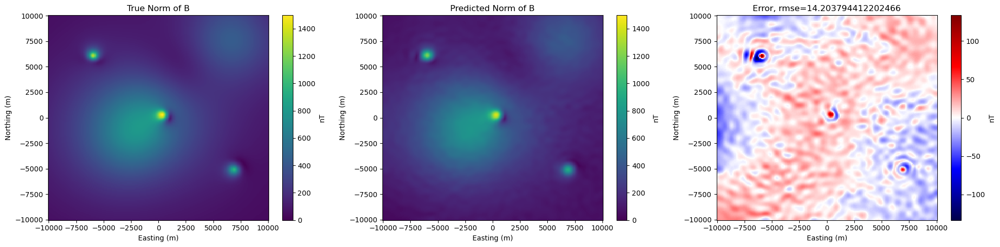

regional source easting: 8500


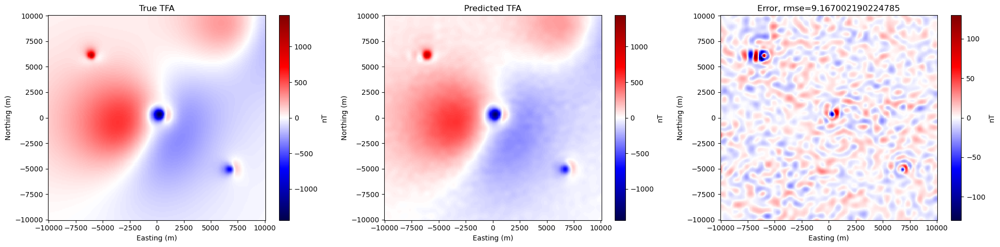

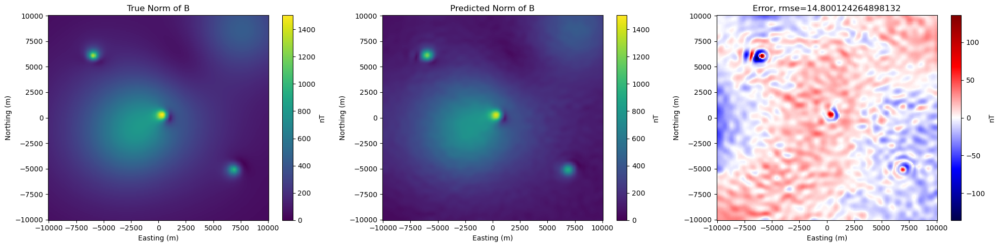

regional source easting: 9500


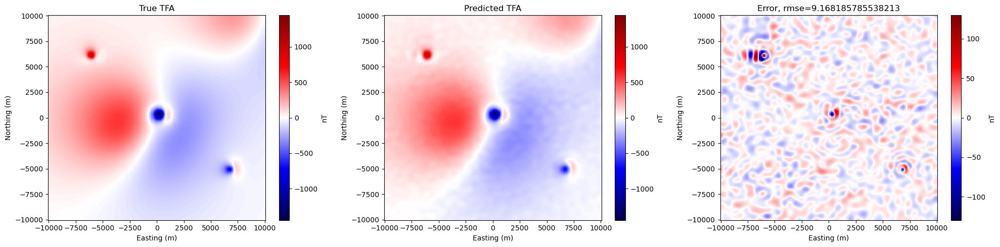

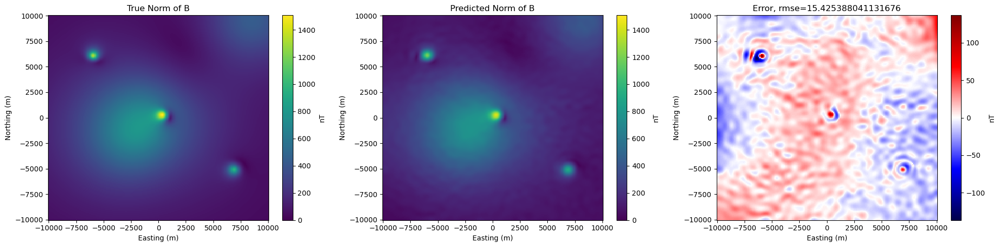

regional source easting: 10500


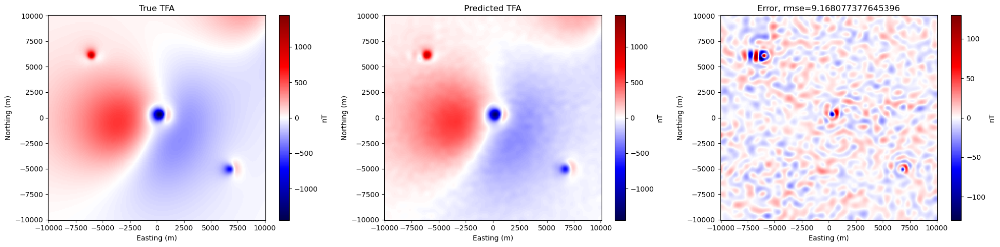

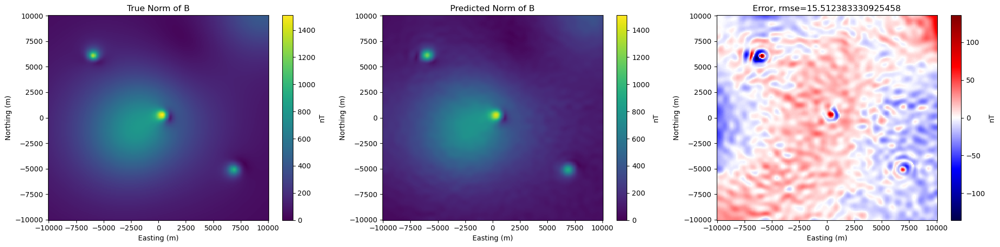

regional source easting: 11500


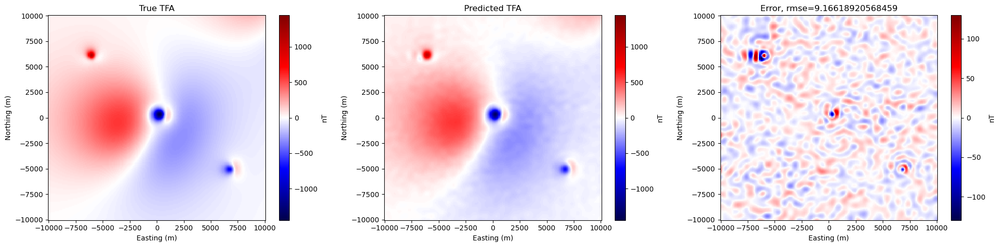

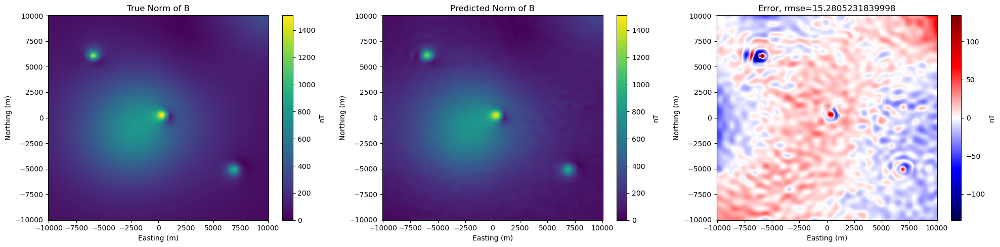

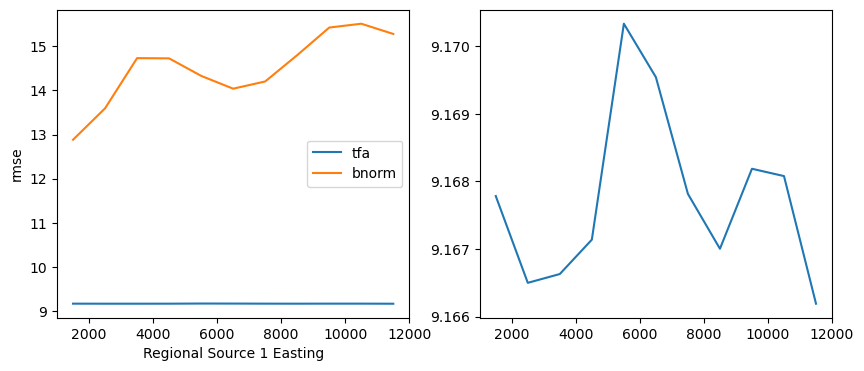

In [30]:
region = [-10e3, 10e3, -10e3, 10e3]
# Inc and dec from the IGRF around Antarctica
field_direction = eqs.angles_to_vector(inclination=-45, declination=-70, amplitude=1)
#field_direction = eqs.angles_to_vector(inclination=84, declination=120, amplitude=1)

# Generate fake flight lines
easting, northing = [c.ravel() for c in vd.grid_coordinates(region, spacing=(10, 500))]
easting_tie, northing_tie = [c.ravel() for c in vd.grid_coordinates(region, spacing=(5000, 10))]
easting = np.concatenate([easting, easting_tie])
northing = np.concatenate([northing, northing_tie])
upward = vd.synthetic.CheckerBoard(region=region, amplitude=50, w_east=20000, w_north=15000).predict((easting, northing)) + 500
coordinates = (easting, northing, upward)
for i, c in enumerate(coordinates):
    eqs.contaminate(c, standard_deviation=4, random_state=i)


regional3_eastings = [1500, 2500, 3500, 4500, 5500, 6500, 7500, 8500, 9500, 10500, 11500]

rmses2_tfa = []
rmses2_bnorm = []

for i in regional3_eastings:
    dipole_moments = []
    source_coordinates = []
    # Regional
    source_coordinates.append([[-1500], [-2000], [-5e3]])
    dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))
    source_coordinates.append([[0], [0], [-5e3]])
    dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))
        # regional 3
    source_coordinates.append([[i], [i], [-5e3]])
    dipole_moments.append(eqs.angles_to_vector(-35, -80, 5e11))
    # Point source top left
    source_coordinates.append([[-6000], [6000], [-90]])
    dipole_moments.append(eqs.angles_to_vector(-50, 40, 15e8))
    # Point source middle
    source_coordinates.append([[500], [300], [-300]])
    dipole_moments.append(eqs.angles_to_vector(60, 65, 50e8))
    # point source bottom right
    source_coordinates.append([[7000], [-5000], [-150]])
    dipole_moments.append(eqs.angles_to_vector(40, 55, 15e8))
    source_coordinates = np.concatenate(source_coordinates, axis=1)
    dipole_moments = np.concatenate(dipole_moments, axis=1)
        
    # SYNTHETIC
    b_field = eqs.dipole_magnetic(coordinates, source_coordinates, dipole_moments)
    tfa = eqs.contaminate(
        eqs.total_field_anomaly(b_field, field_direction), standard_deviation=50, random_state=42,
    )
    bnorm = eqs.magnetic_field_norm(b_field)
    
    # Block average coordinates
    reducer = vd.BlockReduce(reduction=np.median, spacing=2e3, drop_coords=False)
    # Use the filter method to apply the reduction:
    coords_blocked, tfa_blocked = reducer.filter(coordinates, data=tfa)
    
    ## DEEP EQS
    spacing = np.mean(vd.median_distance(coords_blocked))
    eqs_deep = eqs.EquivalentSourcesMagnetic(damping=1e-3, depth=(spacing*4.25))
    eqs_deep.fit(coords_blocked, tfa_blocked, field_direction)
    tfa_deep_blocked = eqs.total_field_anomaly(eqs_deep.predict(coords_blocked), field_direction)
    tfa_deep = eqs.total_field_anomaly(eqs_deep.predict(coordinates), field_direction)
    tfa_residuals = tfa - tfa_deep
    
    ## SHALLOW EQS
    eqs_shallow = eqs.EquivalentSourcesMagneticGB(random_state=0, block_size=100, damping=1e2, depth=1e3)
    eqs_shallow.fit(coordinates, tfa_residuals, field_direction)
    tfa_residuals_prediction = eqs.total_field_anomaly(eqs_shallow.predict(coordinates), field_direction)
    
    ## REGULAR GRID PREDICTION
    grid_coordinates = vd.grid_coordinates(region, spacing=100, extra_coords=500)
    true_b = eqs.dipole_magnetic(grid_coordinates, source_coordinates, dipole_moments)
    predicted_b = eqs_deep.predict(grid_coordinates) + eqs_shallow.predict(grid_coordinates)

    true_tfa = eqs.total_field_anomaly(true_b, field_direction)
    predicted_tfa = eqs.total_field_anomaly(predicted_b, field_direction)
    error_tfa = true_tfa - predicted_tfa
    
    true_norm_of_b = np.sqrt(sum(c**2 for c in true_b))
    predicted_norm_of_b = np.sqrt(sum(c**2 for c in predicted_b))
    error_norm_of_b = true_norm_of_b - predicted_norm_of_b
    
    print("regional source easting:", i)
    
    scale_tfa = vd.maxabs(true_tfa)
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    plt.pcolormesh(*grid_coordinates[:2], true_tfa, cmap="seismic", vmin=-scale_tfa, vmax=scale_tfa)
    plt.title("True TFA")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,2)
    plt.pcolormesh(*grid_coordinates[:2], predicted_tfa, cmap="seismic", vmin=-scale_tfa, vmax=scale_tfa)
    plt.title("Predicted TFA")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,3)
    diff_scale = vd.maxabs(error_tfa)
    rmse_tfa = np.sqrt(np.square(error_tfa).mean())
    plt.pcolormesh(*grid_coordinates[:2], error_tfa, cmap="seismic", vmin=-diff_scale, vmax=diff_scale)
    plt.title('Error, rmse={}'.format(rmse_tfa))
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.tight_layout()
    plt.show()
    
    scale_b = vd.maxabs(true_norm_of_b)
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    plt.pcolormesh(*grid_coordinates[:2], true_norm_of_b, cmap="viridis", vmin=0, vmax=scale_b)
    plt.title("True Norm of B")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,2)
    plt.pcolormesh(*grid_coordinates[:2], predicted_norm_of_b, cmap="viridis", vmin=0, vmax=scale_b)
    plt.title("Predicted Norm of B")
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.subplot(1,3,3)
    diff_scale = vd.maxabs(error_norm_of_b)
    rmse_bnorm = np.sqrt(np.square(error_norm_of_b).mean())
    plt.pcolormesh(*grid_coordinates[:2], error_norm_of_b, cmap="seismic", vmin=-diff_scale, vmax=diff_scale)
    plt.title('Error, rmse={}'.format(rmse_bnorm))
    plt.xlabel("Easting (m)")
    plt.ylabel("Northing (m)")
    plt.colorbar(label="nT")
    plt.tight_layout()
    plt.show()
    
    rmses2_tfa.append(rmse_tfa)
    rmses2_bnorm.append(rmse_bnorm)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(regional3_eastings, rmses2_tfa, label='tfa')
plt.plot(regional3_eastings, rmses2_bnorm, label='bnorm')
plt.xlabel('Regional Source 1 Easting')
plt.ylabel('rmse')
plt.legend()
plt.subplot(1,2,2)
plt.plot(regional3_eastings, rmses2_tfa, label='tfa')
plt.show()